# Evaluate MQA performance

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
pd.options.display.float_format = '{:.3f}'.format
plt.rcParams["figure.dpi"] = 150
sns.set(style='darkgrid')
from IPython.display import display
import warnings
warnings.simplefilter('ignore', UserWarning)
from pathlib import Path
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams["font.size"] = 15
plt.rcParams['figure.figsize'] = (6, 4)

In [2]:
data_dir = Path('../../../../../data/')
dataset_dir = data_dir / 'out' / 'dataset'
subset_name = 'target_subset_' + Path('.').resolve().parent.name
score_dir = dataset_dir / 'score' / 'subsets' / subset_name
assert score_dir.exists()
fig_dir = score_dir / 'fig' / 'MQA'
fig_dir.mkdir(parents=True, exist_ok=True)
target_list = data_dir / 'interim' / f'{subset_name}.csv'
assert target_list.exists()

In [3]:
label_path = score_dir / 'label.csv'
label_df = pd.read_csv(label_path, index_col=0)
target_df = pd.read_csv(target_list, index_col=0)
label_df = pd.merge(label_df, target_df, left_on='Target', right_on='id', how='left')
label_df.head()

,Model,TMscore,GDT_TS,GDT_HA,Global_LDDT,Mean_LDDT,pLDDT,pTMscore,Tolerance,ModelName,...,Length,id,resolution,releasedate,header,sequence,length,num_entry_in_cluster,num_entry_in_cluster_AF2_notInclude,is_similar_AF2
0,model_1_ptm_seed_0_rec_10_ens_1,0.981,0.965,0.857,0.899,0.894,0.936,0.892,0.084,model_1_ptm,...,235,7DW4_A,1.570,2021-08-04T00:00:00Z,>7dw4_A mol:protein length:235 Glutathione S-...,HHHHHHMAKSDVKLLGAWPSPFVMRPRIALNIKSVEYEFLEETLGS...,235,89,13,True
1,model_1_ptm_seed_0_rec_10_ens_8,0.981,0.966,0.859,0.900,0.895,0.937,0.893,0.054,model_1_ptm,...,235,7DW4_A,1.570,2021-08-04T00:00:00Z,>7dw4_A mol:protein length:235 Glutathione S-...,HHHHHHMAKSDVKLLGAWPSPFVMRPRIALNIKSVEYEFLEETLGS...,235,89,13,True
2,model_1_ptm_seed_0_rec_1_ens_1,0.980,0.965,0.852,0.901,0.896,0.928,0.887,26.445,model_1_ptm,...,235,7DW4_A,1.570,2021-08-04T00:00:00Z,>7dw4_A mol:protein length:235 Glutathione S-...,HHHHHHMAKSDVKLLGAWPSPFVMRPRIALNIKSVEYEFLEETLGS...,235,89,13,True
3,model_1_ptm_seed_0_rec_1_ens_8,0.980,0.964,0.856,0.899,0.895,0.928,0.887,26.413,model_1_ptm,...,235,7DW4_A,1.570,2021-08-04T00:00:00Z,>7dw4_A mol:protein length:235 Glutathione S-...,HHHHHHMAKSDVKLLGAWPSPFVMRPRIALNIKSVEYEFLEETLGS...,235,89,13,True
4,model_1_ptm_seed_0_rec_2_ens_1,0.980,0.961,0.852,0.900,0.895,0.933,0.890,0.391,model_1_ptm,...,235,7DW4_A,1.570,2021-08-04T00:00:00Z,>7dw4_A mol:protein length:235 Glutathione S-...,HHHHHHMAKSDVKLLGAWPSPFVMRPRIALNIKSVEYEFLEETLGS...,235,89,13,True


In [4]:
for i, csv in enumerate(sorted(score_dir.glob('*.csv'))):
    if csv.stem == 'label' or csv.stem == 'all_score' or csv.stem.startswith('mqa'):
        continue
    if i == 0:
        mqa_df = pd.read_csv(csv, index_col=0)
    else:
        mqa_df = pd.merge(mqa_df, pd.read_csv(csv, index_col=0), on=['Model', 'Target'], how='outer')
mqa_df['DOPE'] = - mqa_df['DOPE']
mqa_df['SOAP'] = - mqa_df['SOAP']
mqa_df

,Model,DOPE,SOAP,Target,DeepAccNet,DeepAccNet-Bert,P3CMQA,ProQ2D,ProQRosCenD,ProQRosFAD,ProQ3D,SBROD,VoroCNN
0,model_1_ptm_seed_0_rec_10_ens_1,29608.344,116971.344,7DW4_A,0.977,0.981,0.941,0.660,0.690,0.922,0.795,1.561,0.679
1,model_1_ptm_seed_0_rec_10_ens_8,29653.650,117449.914,7DW4_A,0.978,0.981,0.941,0.664,0.691,0.924,0.798,1.563,0.679
2,model_1_ptm_seed_0_rec_1_ens_1,29679.896,118798.586,7DW4_A,0.975,0.971,0.939,0.621,0.658,0.906,0.763,1.560,0.680
3,model_1_ptm_seed_0_rec_1_ens_8,29701.287,117463.500,7DW4_A,0.973,0.971,0.939,0.625,0.677,0.910,0.770,1.561,0.679
4,model_1_ptm_seed_0_rec_2_ens_1,29673.592,118283.023,7DW4_A,0.976,0.971,0.941,0.667,0.697,0.922,0.804,1.562,0.677
...,...,...,...,...,...,...,...,...,...,...,...,...,...
107795,model_5_seed_1_rec_7_ens_8,39371.445,343708.969,7MT1_A,0.848,0.837,0.880,0.664,0.803,0.914,0.870,1.879,0.702
107796,model_5_seed_1_rec_8_ens_1,39388.082,341629.625,7MT1_A,0.845,0.854,0.881,0.678,0.808,0.914,0.872,1.888,0.705
107797,model_5_seed_1_rec_8_ens_8,39335.102,342088.125,7MT1_A,0.844,0.821,0.881,0.648,0.804,0.913,0.868,1.874,0.705
107798,model_5_seed_1_rec_9_ens_1,39483.047,344117.938,7MT1_A,0.856,0.869,0.879,0.682,0.806,0.915,0.872,1.879,0.702


In [5]:
df = pd.merge(label_df, mqa_df, on=['Target', 'Model'], how='left')
df_output_path = score_dir / 'all_score.csv.gz'
if not df_output_path.exists():
    df.to_csv(df_output_path, compression='gzip')
df

,Model,TMscore,GDT_TS,GDT_HA,Global_LDDT,Mean_LDDT,pLDDT,pTMscore,Tolerance,ModelName,...,SOAP,DeepAccNet,DeepAccNet-Bert,P3CMQA,ProQ2D,ProQRosCenD,ProQRosFAD,ProQ3D,SBROD,VoroCNN
0,model_1_ptm_seed_0_rec_10_ens_1,0.981,0.965,0.857,0.899,0.894,0.936,0.892,0.084,model_1_ptm,...,116971.344,0.977,0.981,0.941,0.660,0.690,0.922,0.795,1.561,0.679
1,model_1_ptm_seed_0_rec_10_ens_8,0.981,0.966,0.859,0.900,0.895,0.937,0.893,0.054,model_1_ptm,...,117449.914,0.978,0.981,0.941,0.664,0.691,0.924,0.798,1.563,0.679
2,model_1_ptm_seed_0_rec_1_ens_1,0.980,0.965,0.852,0.901,0.896,0.928,0.887,26.445,model_1_ptm,...,118798.586,0.975,0.971,0.939,0.621,0.658,0.906,0.763,1.560,0.680
3,model_1_ptm_seed_0_rec_1_ens_8,0.980,0.964,0.856,0.899,0.895,0.928,0.887,26.413,model_1_ptm,...,117463.500,0.973,0.971,0.939,0.625,0.677,0.910,0.770,1.561,0.679
4,model_1_ptm_seed_0_rec_2_ens_1,0.980,0.961,0.852,0.900,0.895,0.933,0.890,0.391,model_1_ptm,...,118283.023,0.976,0.971,0.941,0.667,0.697,0.922,0.804,1.562,0.677
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107795,model_5_seed_1_rec_7_ens_8,0.996,0.994,0.948,0.933,0.930,0.874,NaN,1.251,model_5,...,343708.969,0.848,0.837,0.880,0.664,0.803,0.914,0.870,1.879,0.702
107796,model_5_seed_1_rec_8_ens_1,0.996,0.993,0.949,0.935,0.931,0.880,NaN,0.277,model_5,...,341629.625,0.845,0.854,0.881,0.678,0.808,0.914,0.872,1.888,0.705
107797,model_5_seed_1_rec_8_ens_8,0.996,0.994,0.948,0.933,0.929,0.872,NaN,0.574,model_5,...,342088.125,0.844,0.821,0.881,0.648,0.804,0.913,0.868,1.874,0.705
107798,model_5_seed_1_rec_9_ens_1,0.996,0.993,0.948,0.937,0.933,0.887,NaN,0.334,model_5,...,344117.938,0.856,0.869,0.879,0.682,0.806,0.915,0.872,1.879,0.702


In [6]:
import sys
sys.path.append('../../../../mqa')
from eval import eval, stat_test, eval_get_df

In [7]:
mqa_df.columns

Index(['Model', 'DOPE', 'SOAP', 'Target', 'DeepAccNet', 'DeepAccNet-Bert',
       'P3CMQA', 'ProQ2D', 'ProQRosCenD', 'ProQRosFAD', 'ProQ3D', 'SBROD',
       'VoroCNN'],
      dtype='object')

## Evaluate MQA peformance per target

### For GDT_TS

In [8]:
# Against gdtts
mqa_methods = ['DOPE', 'SOAP', 'ProQ3D', 'SBROD', 'VoroCNN', 'P3CMQA', 'DeepAccNet', 'DeepAccNet-Bert']
methods = mqa_methods + ['pLDDT', 'pTMscore']
label = 'GDT_TS'
data = df
result_df = eval(data, methods, label_name=label)
result_df

300


,Method,GDT_TS Pearson,GDT_TS Spearman,GDT_TS Loss,GDT_TS MAE
0,DOPE,0.131,0.109,2.397,NaN
1,SOAP,0.136,0.118,2.109,NaN
2,ProQ3D,0.016,0.004,2.710,0.170
3,SBROD,0.009,0.008,3.287,NaN
4,VoroCNN,0.068,0.050,2.294,0.255
5,P3CMQA,0.083,0.069,2.674,0.119
6,DeepAccNet,0.134,0.105,2.192,0.073
7,DeepAccNet-Bert,0.112,0.102,2.169,0.087
8,pLDDT,0.203,0.167,2.087,0.063
9,pTMscore,0.181,0.168,1.809,0.081


In [9]:
methods

['DOPE',
 'SOAP',
 'ProQ3D',
 'SBROD',
 'VoroCNN',
 'P3CMQA',
 'DeepAccNet',
 'DeepAccNet-Bert',
 'pLDDT',
 'pTMscore']

In [10]:
# Against gdtts (For targets whose value difference between max and min is larger than 0.05)
label = 'GDT_TS'
data = df.groupby('Target').filter(lambda x: x[label].max() - x[label].min() > 0.05)
result_df = eval(data, methods, label_name=label)
result_df

99


,Method,GDT_TS Pearson,GDT_TS Spearman,GDT_TS Loss,GDT_TS MAE
0,DOPE,0.236,0.195,5.143,NaN
1,SOAP,0.245,0.216,4.352,NaN
2,ProQ3D,0.102,0.072,5.927,0.192
3,SBROD,0.019,0.023,7.768,NaN
4,VoroCNN,0.151,0.119,4.653,0.210
5,P3CMQA,0.173,0.147,5.921,0.146
6,DeepAccNet,0.255,0.205,4.649,0.107
7,DeepAccNet-Bert,0.206,0.182,4.438,0.123
8,pLDDT,0.277,0.225,4.407,0.089
9,pTMscore,0.281,0.240,3.536,0.085


In [11]:
# Against gdtts
mqa_methods = ['DOPE', 'SOAP', 'ProQ3D', 'SBROD', 'VoroCNN', 'P3CMQA', 'DeepAccNet', 'DeepAccNet-Bert']
methods = mqa_methods + ['pLDDT', 'pTMscore']
label = 'GDT_TS'
data = df.groupby('Target').filter(lambda x: x[label].max() - x[label].min() > 0.05)
result_each_target = eval_get_df(data, methods, label_name=label)
def get_whole_result_from_each_target(result_each_target, columns):
    result_df = result_each_target.groupby('Method').mean().reset_index()
    order_dict = dict(zip(columns, range(len(columns))))
    result_df['order'] = result_df['Method'].apply(lambda x: order_dict[x])
    result_df = result_df.sort_values('order')
    result_df = result_df.set_index('Method')
    result_df = result_df.reset_index().drop('order', axis=1)
    return result_df
result_df = get_whole_result_from_each_target(result_each_target, methods + ['Random selection'])
result_each_target = pd.merge(result_each_target, target_df, left_on='Target', right_on='id', how='left')
result_each_target.to_csv(score_dir / 'mqa_result_each_target_gdtts_5.csv')
result_df

99


,Method,GDT_TS Pearson,GDT_TS Spearman,GDT_TS Loss,GDT_TS MAE
0,DOPE,0.236,0.195,5.143,NaN
1,SOAP,0.245,0.216,4.352,NaN
2,ProQ3D,0.102,0.072,5.927,0.192
3,SBROD,0.019,0.023,7.768,NaN
4,VoroCNN,0.151,0.119,4.653,0.210
5,P3CMQA,0.173,0.147,5.921,0.146
6,DeepAccNet,0.255,0.205,4.649,0.107
7,DeepAccNet-Bert,0.206,0.182,4.438,0.123
8,pLDDT,0.277,0.225,4.407,0.089
9,pTMscore,0.281,0.240,3.536,0.085


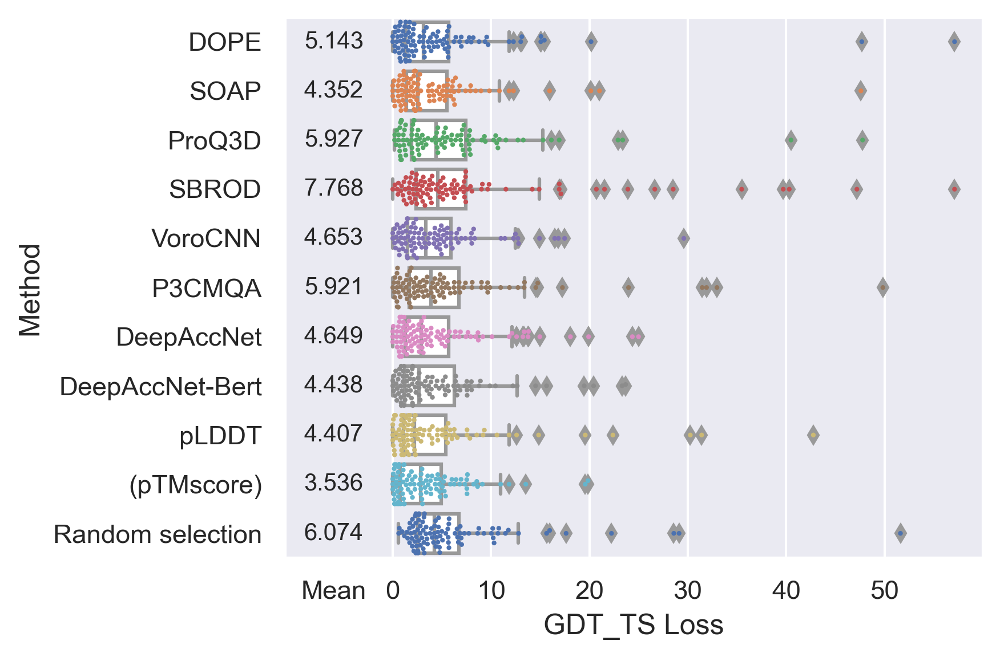

In [12]:
label = 'GDT_TS'
metric = 'Loss'
sns.boxplot(data=result_each_target, x=f'{label} {metric}', y=f'Method', order=methods + ['Random selection'], color='white')
sns.swarmplot(data=result_each_target, x=f'{label} {metric}', y=f'Method', order=methods + ['Random selection'], size=2, palette='deep')
xticks = np.arange(-1, 6) * 10
xticks_start = -6
xticks[0] = xticks_start
xticks_str = xticks.astype(str)
xticks_str[0] = 'Mean'
plt.xlim(-11, 60)
plt.xticks(xticks, xticks_str)
plt.axvline(x=xticks_start, color=(234/255,234/255,242/255))
# put parentheses around the pTMscore
yticks, yticks_texts = plt.yticks()
for i, ytick_text in enumerate(yticks_texts):
    if ytick_text.get_text() == 'pTMscore':
        yticks_texts[i] = '(pTMscore)'
plt.yticks(yticks, yticks_texts)
for i, method in enumerate(methods + ['Random selection']):
    value = result_df.query('Method == @method')[f'{label} {metric}'].values[0]
    plt.text(xticks_start, i, f'{value:.3f}', size=10, horizontalalignment='center', verticalalignment='center')
plt.tight_layout()
plt.savefig(fig_dir / f'boxplot_{label}_{metric}.png')

In [13]:
result_each_target.query('Method == "Random selection"')[['Target', 'GDT_TS Loss']].sort_values('GDT_TS Loss')

,Target,GDT_TS Loss
1040,6ONC_D,0.598
1057,6SJ5_A,0.664
1015,6GJK_A,0.953
1048,6QPS_A,1.174
1075,7BWV_A,1.438
...,...,...
1030,6KJU_A,17.623
1029,6JW0_A,22.237
1045,6QDI_A,28.573
1007,6E7E_A,29.111


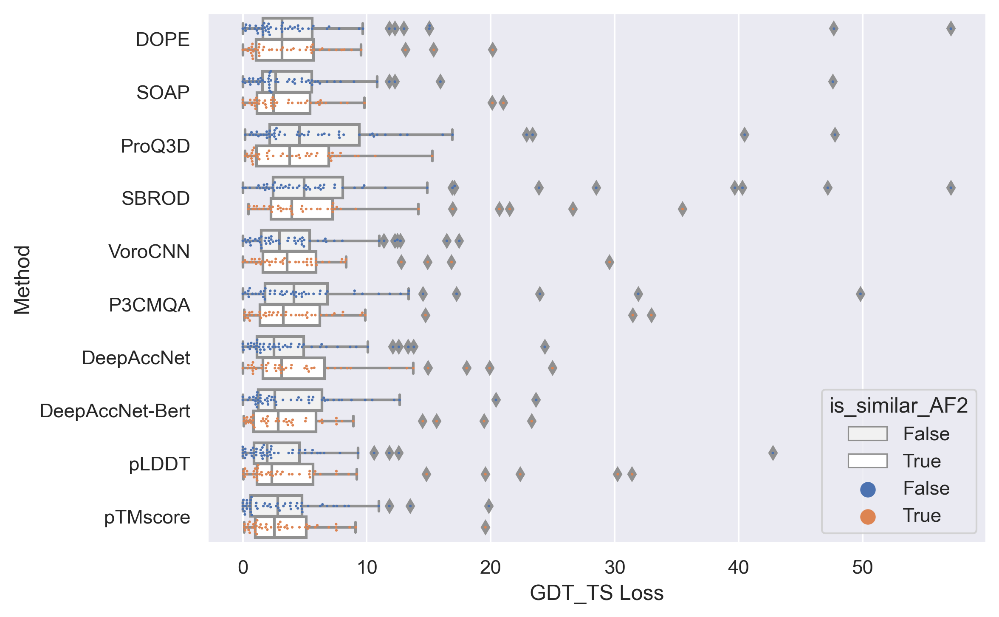

In [14]:
label = 'GDT_TS'
metric = 'Loss'
plt.figure(figsize=(8, 5))
sns.boxplot(data=result_each_target, x=f'{label} {metric}', y=f'Method', order=methods, hue='is_similar_AF2', color='white')
sns.swarmplot(data=result_each_target, x=f'{label} {metric}', y=f'Method', order=methods, size=1.5, hue='is_similar_AF2', dodge=True)
plt.tight_layout()
plt.savefig(fig_dir / f'boxplot_{label}_{metric}_similar_af2.png')

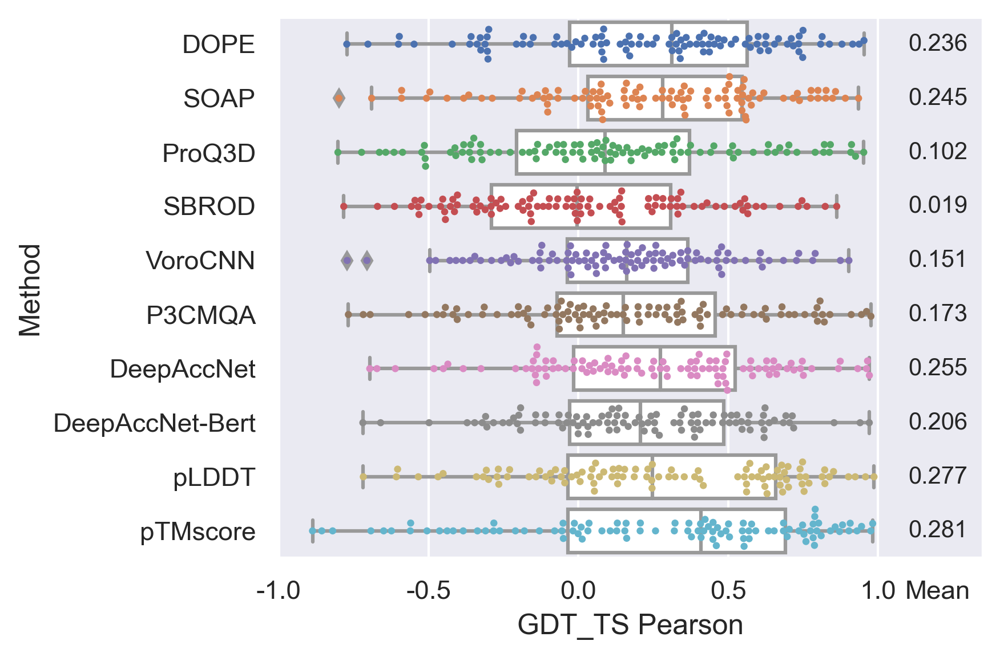

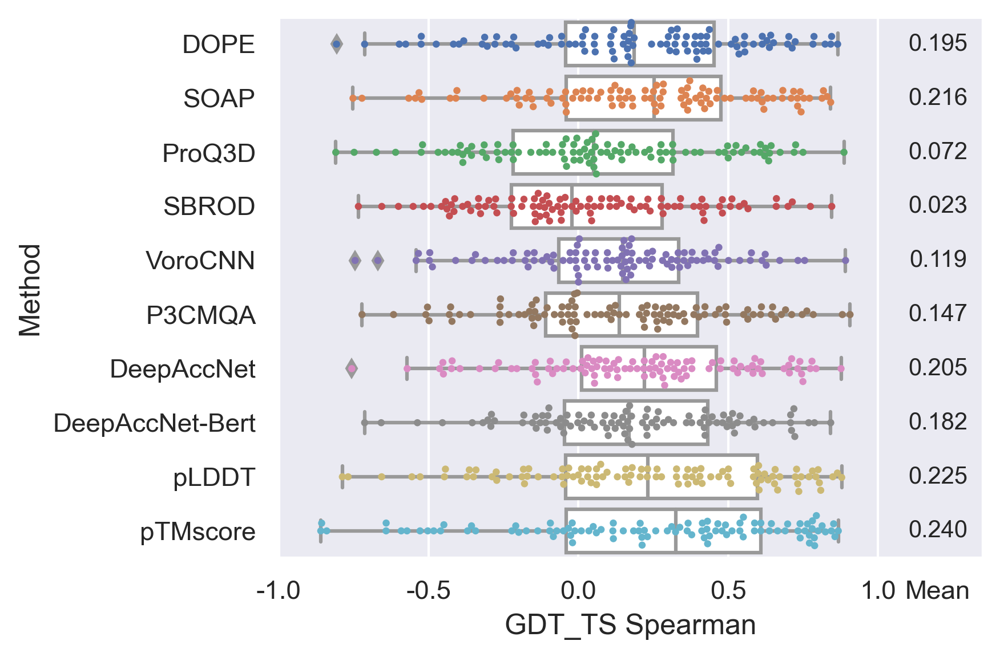

In [15]:
metrics = ['Pearson', 'Spearman']
data = result_each_target
label = 'GDT_TS'
y = 'Method'
for metric in metrics:
    x = f'{label} {metric}'
    sns.boxplot(data=data, x=x, y=y, order=methods, color='white')
    sns.swarmplot(data=data, x=x, y=y, order=methods, size=3)
    xticks_max = 1.2
    plt.xlim(-1, 1.35)
    xticks = np.append(np.arange(-1.0, 1.2, 0.5), [xticks_max])
    xticks_str = list(map(lambda x: f'{x:.1f}', xticks))
    xticks_str[-1] = 'Mean'
    plt.xticks(xticks, xticks_str)
    plt.axvline(x=xticks_max, color=(234/255,234/255,242/255))
    mean_series = data.groupby(y).mean()[x]
    for i, method in enumerate(methods):
        value = mean_series[method]
        plt.text(xticks_max, i, f'{value:.3f}', size=10, horizontalalignment='center', verticalalignment='center')
    plt.tight_layout()
    plt.savefig(fig_dir / f'boxplot_{label}_{metric}.png')
    plt.show()

<AxesSubplot:xlabel='GDT_TS MAE', ylabel='Method'>

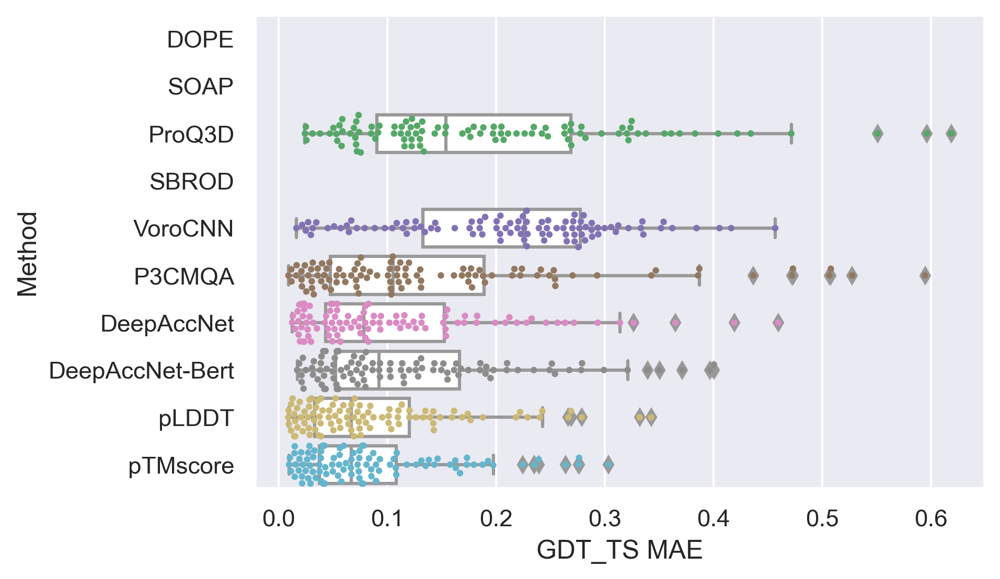

In [16]:
label = 'GDT_TS'
metric = 'MAE'
x = f'{label} {metric}'
sns.boxplot(data=data, x=x, y=y, order=methods, color='white')
sns.swarmplot(data=data, x=x, y=y, order=methods, size=3)

In [17]:
# Against gdtts (For models by ptm models)
mqa_methods = ['DOPE', 'SOAP', 'ProQ3D', 'SBROD', 'VoroCNN', 'P3CMQA', 'DeepAccNet', 'DeepAccNet-Bert']
methods = mqa_methods + ['pLDDT', 'pTMscore']
label = 'GDT_TS'
data = df[~df['pTMscore'].isna()].groupby('Target').filter(lambda x: x[label].max() - x[label].min() > 0.05)
result_each_target_ptm = eval_get_df(data, methods, label_name=label)
result_df_ptm = get_whole_result_from_each_target(result_each_target_ptm, methods + ['Random selection'])
result_each_target_ptm = pd.merge(result_each_target_ptm, target_df, left_on='Target', right_on='id', how='left')
result_df_ptm

87


,Method,GDT_TS Pearson,GDT_TS Spearman,GDT_TS Loss,GDT_TS MAE
0,DOPE,0.240,0.216,4.457,NaN
1,SOAP,0.246,0.211,4.054,NaN
2,ProQ3D,0.131,0.102,5.411,0.192
3,SBROD,0.026,0.021,6.526,NaN
4,VoroCNN,0.191,0.158,3.918,0.204
5,P3CMQA,0.167,0.149,5.645,0.146
6,DeepAccNet,0.259,0.209,4.030,0.112
7,DeepAccNet-Bert,0.230,0.192,4.602,0.126
8,pLDDT,0.278,0.230,3.451,0.092
9,pTMscore,0.296,0.264,2.925,0.084


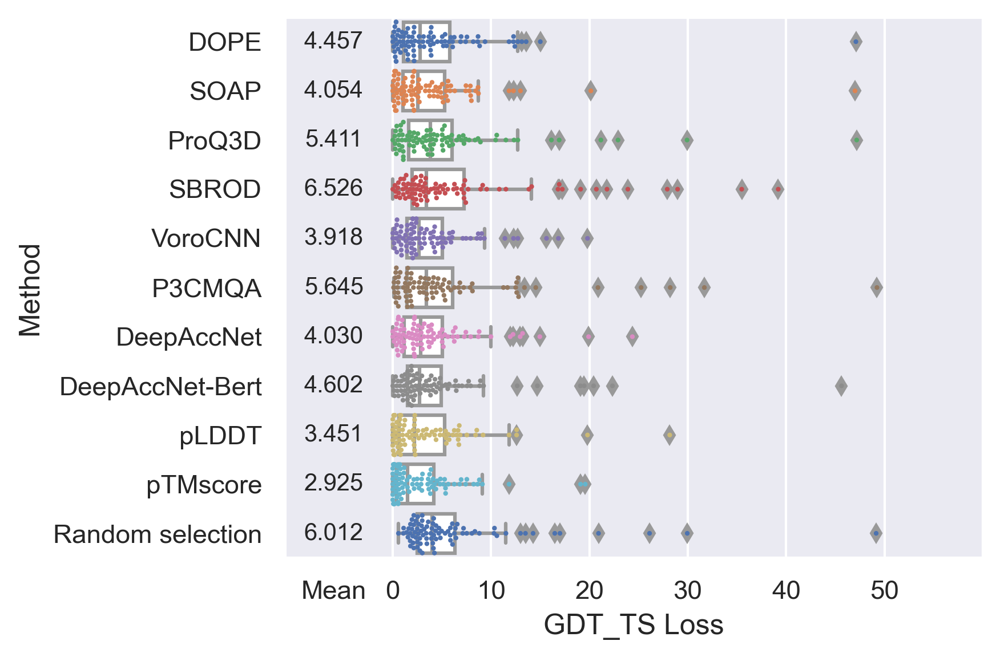

In [18]:
# Against gdtts (For models by ptm models)
label = 'GDT_TS'
metric = 'Loss'
sns.boxplot(data=result_each_target_ptm, x=f'{label} {metric}', y=f'Method', order=methods + ['Random selection'], color='white')
sns.swarmplot(data=result_each_target_ptm, x=f'{label} {metric}', y=f'Method', order=methods + ['Random selection'], size=2, palette='deep')
xticks = np.arange(-1, 6) * 10
xticks_start = -6
xticks[0] = xticks_start
xticks_str = xticks.astype(str)
xticks_str[0] = 'Mean'
plt.xlim(-11, 60)
plt.xticks(xticks, xticks_str)
plt.axvline(x=xticks_start, color=(234/255,234/255,242/255))
for i, method in enumerate(methods + ['Random selection']):
    value = result_df_ptm.query('Method == @method')[f'{label} {metric}'].values[0]
    plt.text(xticks_start, i, f'{value:.3f}', size=10, horizontalalignment='center', verticalalignment='center')
plt.tight_layout()
plt.savefig(fig_dir / f'boxplot_{label}_{metric}_with_ptm.png')

In [19]:
# Against gdtts
label = 'GDT_TS'
for name, group in df.groupby('is_similar_AF2'):
    print(name)
    data = group
    result_df = eval(data, methods, label_name=label)
    display(result_df)

False
150


,Method,GDT_TS Pearson,GDT_TS Spearman,GDT_TS Loss,GDT_TS MAE
0,DOPE,0.168,0.138,2.773,NaN
1,SOAP,0.154,0.131,2.320,NaN
2,ProQ3D,0.008,0.002,3.383,0.173
3,SBROD,0.001,-0.006,3.874,NaN
4,VoroCNN,0.102,0.081,2.265,0.248
5,P3CMQA,0.059,0.050,3.177,0.147
6,DeepAccNet,0.181,0.156,2.101,0.081
7,DeepAccNet-Bert,0.145,0.134,2.321,0.095
8,pLDDT,0.251,0.209,1.950,0.070
9,pTMscore,0.204,0.189,1.934,0.084


True
150


,Method,GDT_TS Pearson,GDT_TS Spearman,GDT_TS Loss,GDT_TS MAE
0,DOPE,0.095,0.081,2.022,NaN
1,SOAP,0.119,0.104,1.897,NaN
2,ProQ3D,0.024,0.006,2.037,0.168
3,SBROD,0.018,0.021,2.700,NaN
4,VoroCNN,0.035,0.020,2.323,0.261
5,P3CMQA,0.106,0.088,2.171,0.091
6,DeepAccNet,0.088,0.054,2.284,0.065
7,DeepAccNet-Bert,0.080,0.070,2.017,0.079
8,pLDDT,0.155,0.125,2.224,0.056
9,pTMscore,0.157,0.147,1.683,0.078


In [20]:
# Against gdtts (For targets whose value difference between max and min is larger than 0.05)
label = 'GDT_TS'
for name, group in df.groupby('is_similar_AF2'):
    print(name)
    data = group.groupby('Target').filter(lambda x: x[label].max() - x[label].min() > 0.05)
    result_df = eval(data, methods, label_name=label)
    display(result_df)

False
53


,Method,GDT_TS Pearson,GDT_TS Spearman,GDT_TS Loss,GDT_TS MAE
0,DOPE,0.272,0.221,5.920,NaN
1,SOAP,0.256,0.227,4.710,NaN
2,ProQ3D,0.052,0.038,7.428,0.215
3,SBROD,0.023,0.014,8.935,NaN
4,VoroCNN,0.204,0.171,4.420,0.212
5,P3CMQA,0.157,0.136,6.613,0.170
6,DeepAccNet,0.313,0.273,4.096,0.111
7,DeepAccNet-Bert,0.249,0.217,4.492,0.121
8,pLDDT,0.376,0.307,3.772,0.092
9,pTMscore,0.362,0.308,3.652,0.087


True
46


,Method,GDT_TS Pearson,GDT_TS Spearman,GDT_TS Loss,GDT_TS MAE
0,DOPE,0.195,0.166,4.248,NaN
1,SOAP,0.234,0.203,3.940,NaN
2,ProQ3D,0.160,0.111,4.197,0.165
3,SBROD,0.013,0.033,6.423,NaN
4,VoroCNN,0.091,0.059,4.922,0.207
5,P3CMQA,0.192,0.161,5.124,0.118
6,DeepAccNet,0.188,0.125,5.287,0.101
7,DeepAccNet-Bert,0.156,0.141,4.375,0.124
8,pLDDT,0.164,0.131,5.138,0.085
9,pTMscore,0.188,0.161,3.404,0.084


In [21]:
# Against mean lddt
label = 'Mean_LDDT'
data = df
result_df = eval(data, methods, label_name=label)
result_df

272


,Method,Mean_LDDT Pearson,Mean_LDDT Spearman,Mean_LDDT Loss,Mean_LDDT MAE
0,DOPE,0.265,0.235,1.210,NaN
1,SOAP,0.245,0.219,1.149,NaN
2,ProQ3D,0.027,0.005,1.541,0.132
3,SBROD,-0.025,-0.034,2.040,NaN
4,VoroCNN,0.107,0.080,1.466,0.217
5,P3CMQA,0.108,0.096,1.541,0.097
6,DeepAccNet,0.182,0.133,1.181,0.078
7,DeepAccNet-Bert,0.161,0.135,1.183,0.084
8,pLDDT,0.339,0.305,1.120,0.046
9,pTMscore,0.317,0.291,1.088,0.053


In [22]:
# Against mean lddt (For targets whose value difference between max and min is larger than 0.05)
label = 'Mean_LDDT'
data = df.groupby('Target').filter(lambda x: x[label].max() - x[label].min() > 0.05)
result_df = eval(data, methods, label_name=label)
result_df

56


,Method,Mean_LDDT Pearson,Mean_LDDT Spearman,Mean_LDDT Loss,Mean_LDDT MAE
0,DOPE,0.522,0.460,2.595,NaN
1,SOAP,0.484,0.435,1.978,NaN
2,ProQ3D,0.253,0.190,3.150,0.178
3,SBROD,0.106,0.092,5.442,NaN
4,VoroCNN,0.353,0.279,2.924,0.191
5,P3CMQA,0.281,0.222,3.522,0.140
6,DeepAccNet,0.525,0.405,2.145,0.089
7,DeepAccNet-Bert,0.410,0.349,2.067,0.106
8,pLDDT,0.575,0.492,2.202,0.050
9,pTMscore,0.533,0.477,2.068,0.077


In [23]:
# Against mean LDDT
label = 'Mean_LDDT'
for name, group in df.groupby('is_similar_AF2'):
    print(name)
    data = group
    result_df = eval(data, methods, label_name=label)
    display(result_df)

False
135


,Method,Mean_LDDT Pearson,Mean_LDDT Spearman,Mean_LDDT Loss,Mean_LDDT MAE
0,DOPE,0.290,0.251,1.479,NaN
1,SOAP,0.242,0.213,1.289,NaN
2,ProQ3D,0.037,0.012,1.883,0.132
3,SBROD,-0.012,-0.020,2.469,NaN
4,VoroCNN,0.159,0.124,1.683,0.211
5,P3CMQA,0.082,0.074,2.026,0.117
6,DeepAccNet,0.241,0.191,1.306,0.081
7,DeepAccNet-Bert,0.208,0.178,1.328,0.089
8,pLDDT,0.380,0.348,1.216,0.049
9,pTMscore,0.348,0.317,1.196,0.058


True
137


,Method,Mean_LDDT Pearson,Mean_LDDT Spearman,Mean_LDDT Loss,Mean_LDDT MAE
0,DOPE,0.241,0.219,0.945,NaN
1,SOAP,0.249,0.225,1.011,NaN
2,ProQ3D,0.017,-0.002,1.204,0.132
3,SBROD,-0.037,-0.048,1.618,NaN
4,VoroCNN,0.056,0.035,1.252,0.223
5,P3CMQA,0.135,0.118,1.063,0.078
6,DeepAccNet,0.124,0.076,1.059,0.074
7,DeepAccNet-Bert,0.116,0.093,1.041,0.080
8,pLDDT,0.298,0.263,1.024,0.043
9,pTMscore,0.286,0.265,0.982,0.048


### For Mean_LDDT

In [24]:
# Against Mean LDDT
mqa_methods = ['DOPE', 'SOAP', 'ProQ3D', 'SBROD', 'VoroCNN', 'P3CMQA', 'DeepAccNet', 'DeepAccNet-Bert']
methods = mqa_methods + ['pLDDT', 'pTMscore']
label = 'GDT_TS'
data = df.groupby('Target').filter(lambda x: x[label].max() - x[label].min() > 0.05)
label = 'Mean_LDDT'
result_each_target = eval_get_df(data, methods, label_name=label)
result_df = get_whole_result_from_each_target(result_each_target, methods + ['Random selection'])
result_each_target = pd.merge(result_each_target, target_df, left_on='Target', right_on='id', how='left')
result_df

90


,Method,Mean_LDDT Pearson,Mean_LDDT Spearman,Mean_LDDT Loss,Mean_LDDT MAE
0,DOPE,0.386,0.343,1.895,NaN
1,SOAP,0.358,0.325,1.577,NaN
2,ProQ3D,0.132,0.089,2.447,0.175
3,SBROD,0.017,0.016,3.792,NaN
4,VoroCNN,0.219,0.170,2.207,0.205
5,P3CMQA,0.201,0.172,2.533,0.128
6,DeepAccNet,0.347,0.269,1.689,0.090
7,DeepAccNet-Bert,0.278,0.236,1.608,0.102
8,pLDDT,0.428,0.378,1.667,0.050
9,pTMscore,0.407,0.354,1.506,0.074


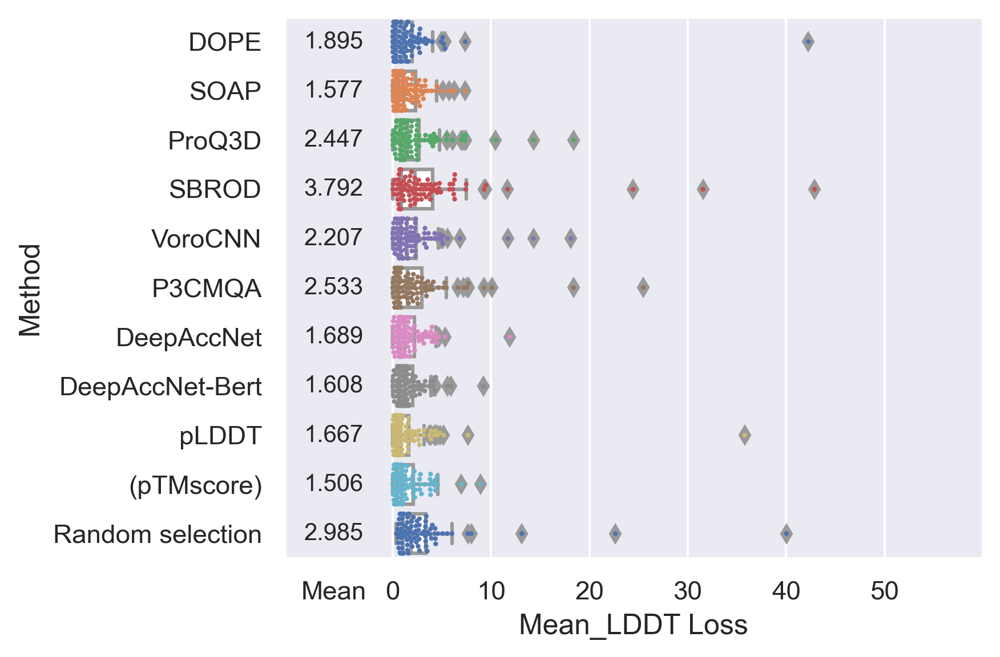

In [25]:
label = 'Mean_LDDT'
metric = 'Loss'
sns.boxplot(data=result_each_target, x=f'{label} {metric}', y=f'Method', order=methods + ['Random selection'], color='white')
sns.swarmplot(data=result_each_target, x=f'{label} {metric}', y=f'Method', order=methods + ['Random selection'], size=2, palette='deep')
xticks = np.arange(-1, 6) * 10
xticks_start = -6
xticks[0] = xticks_start
xticks_str = xticks.astype(str)
xticks_str[0] = 'Mean'
plt.xlim(-11, 60)
plt.xticks(xticks, xticks_str)
plt.axvline(x=xticks_start, color=(234/255,234/255,242/255))
# put parentheses around the pTMscore
yticks, yticks_texts = plt.yticks()
for i, ytick_text in enumerate(yticks_texts):
    if ytick_text.get_text() == 'pTMscore':
        yticks_texts[i] = '(pTMscore)'
plt.yticks(yticks, yticks_texts)
for i, method in enumerate(methods + ['Random selection']):
    value = result_df.query('Method == @method')[f'{label} {metric}'].values[0]
    plt.text(xticks_start, i, f'{value:.3f}', size=10, horizontalalignment='center', verticalalignment='center')
plt.tight_layout()
plt.savefig(fig_dir / f'boxplot_{label}_{metric}.png')

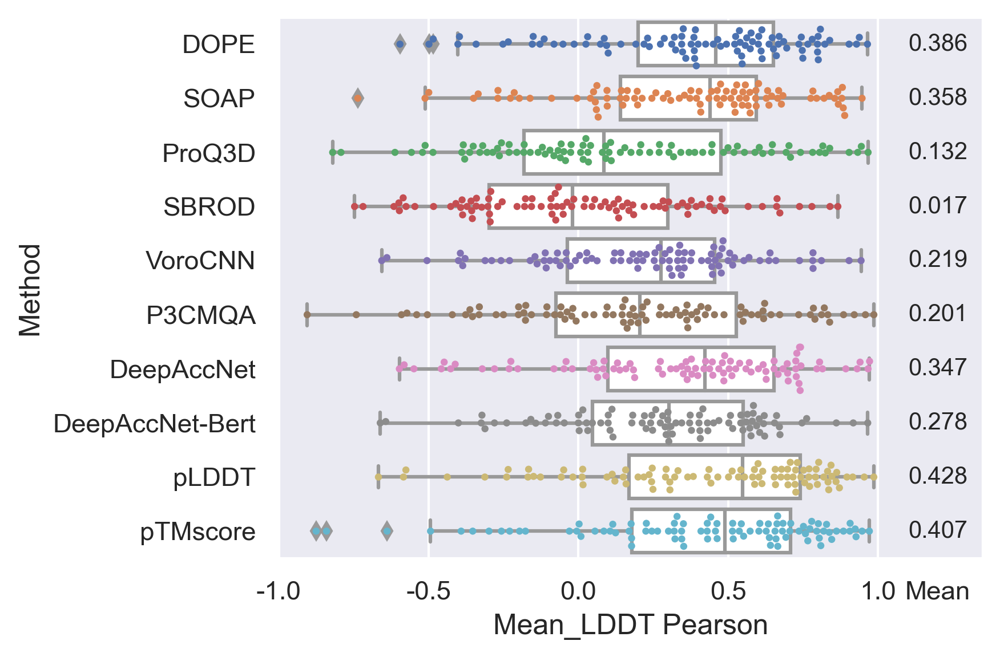

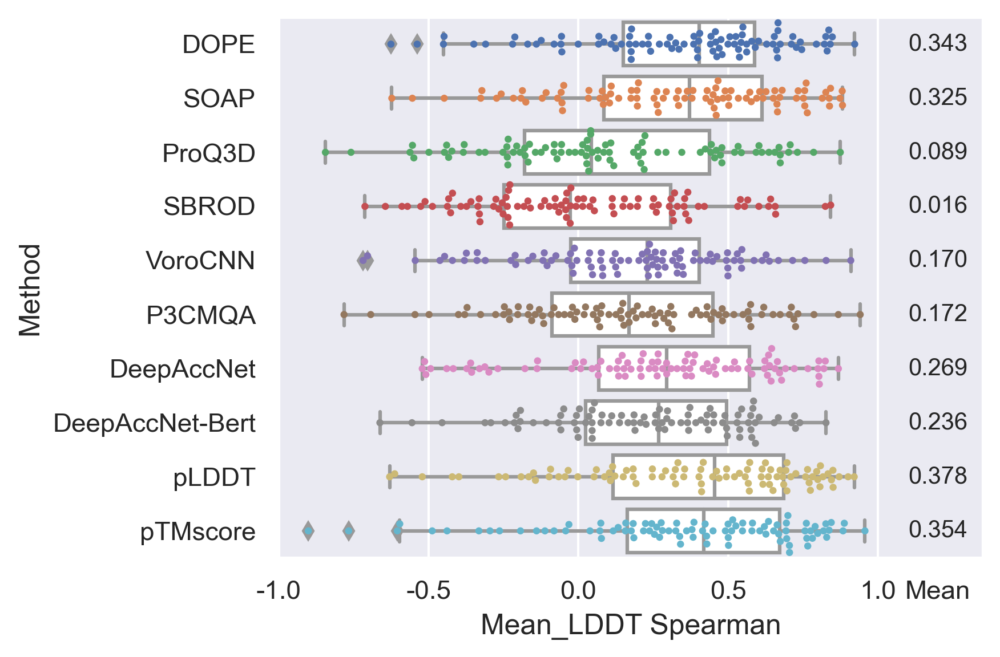

In [26]:
metrics = ['Pearson', 'Spearman']
data = result_each_target
label = 'Mean_LDDT'
y = 'Method'
for metric in metrics:
    x = f'{label} {metric}'
    sns.boxplot(data=data, x=x, y=y, order=methods, color='white')
    sns.swarmplot(data=data, x=x, y=y, order=methods, size=3)
    xticks_max = 1.2
    plt.xlim(-1, 1.35)
    xticks = np.append(np.arange(-1.0, 1.2, 0.5), [xticks_max])
    xticks_str = list(map(lambda x: f'{x:.1f}', xticks))
    xticks_str[-1] = 'Mean'
    plt.xticks(xticks, xticks_str)
    plt.axvline(x=xticks_max, color=(234/255,234/255,242/255))
    mean_series = data.groupby(y).mean()[x]
    for i, method in enumerate(methods):
        value = mean_series[method]
        plt.text(xticks_max, i, f'{value:.3f}', size=10, horizontalalignment='center', verticalalignment='center')
    plt.tight_layout()
    plt.savefig(fig_dir / f'boxplot_{label}_{metric}.png')
    plt.show()

### Error between MQA methods and labels

In [27]:
label = 'GDT_TS'
score = 'pLDDT'
error = df[score] - df[label]
error

0        -0.028
1        -0.029
2        -0.037
3        -0.036
4        -0.029
          ...  
107795   -0.119
107796   -0.112
107797   -0.122
107798   -0.105
107799   -0.121
Length: 107800, dtype: float64

/Users/TAKEI/miniforge3/envs/mypython/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:>

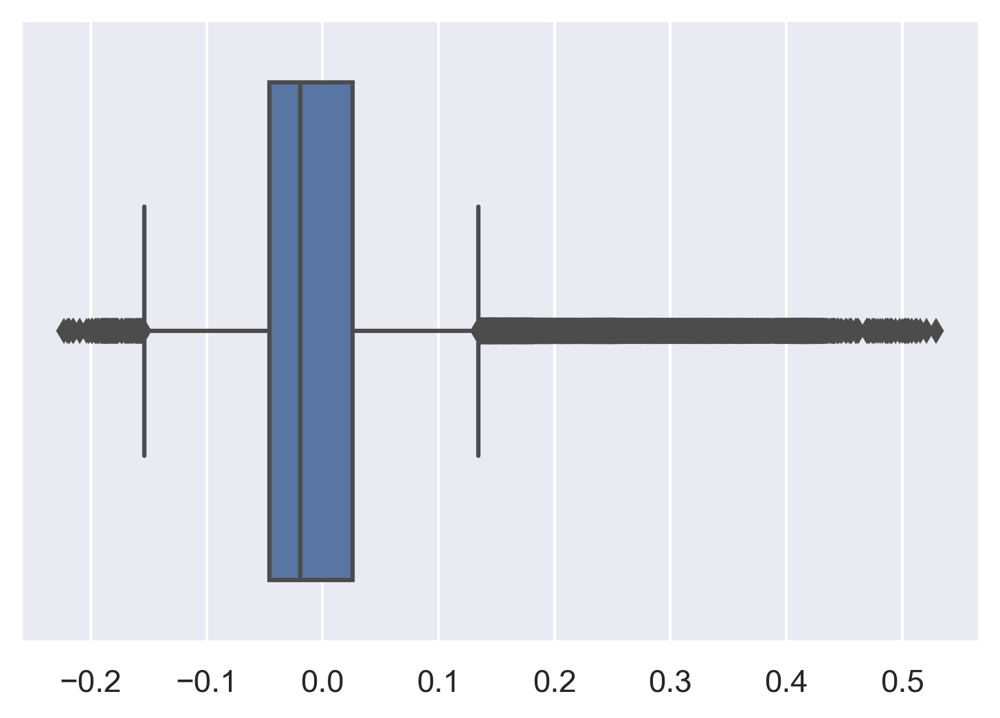

In [28]:
sns.boxplot(error)

## Scatter plot between labels and MQA methods

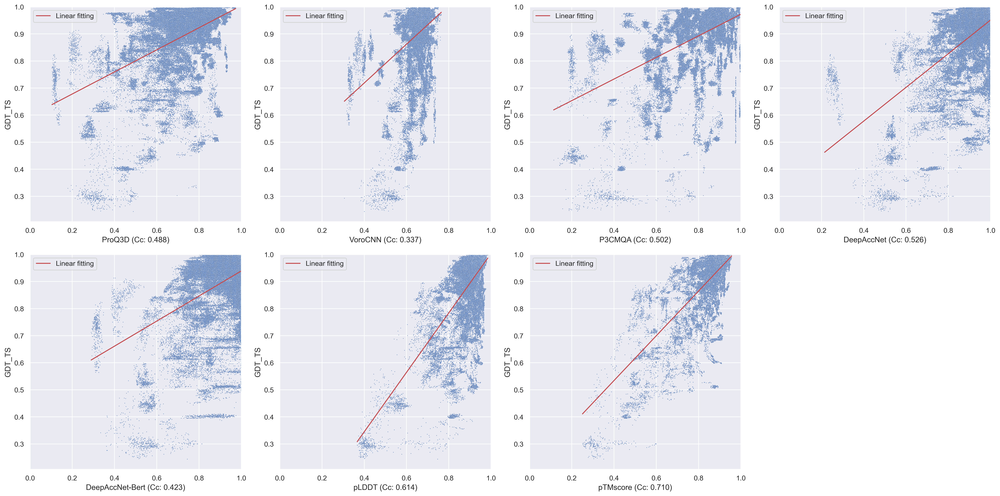

In [29]:
# GDT_TS
nrows = 2
ncols = 4
figsize = (22, 11)
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, sharex=False, sharey=False, figsize=figsize)
label = 'GDT_TS'
ms = ['ProQ3D', 'VoroCNN', 'P3CMQA', 'DeepAccNet', 'DeepAccNet-Bert', 'pLDDT', 'pTMscore']
data = df
for i, method in enumerate(ms):
    ax = axes[i // ncols, i % ncols]
    sns.scatterplot(data=data, x=method, y=label, s=1, ax=axes[i // ncols, i % ncols])
    d = data[~data[method].isna()]
    x = d[method]
    y = d[label]
    corr = d.corr()[method][label]
    ax.set_xlabel(f'{method} (Cc: {corr:.3f})')
    ax.set_xlim(0, 1)
    ax.set_ylim(None, 1)
    x_latent = np.linspace(x.min(), x.max(), 100)
    a, b = np.polyfit(x, y, 1)
    y_latent = a * x_latent + b
    ax.plot(x_latent, y_latent, 'r-')
    ax.legend(['Linear fitting'])
for i in range(len(ms), ncols * nrows):
    ax = axes[i // ncols, i % ncols]
    ax.axis('off')
plt.tight_layout()
plt.savefig(fig_dir / f'scatterplot_methods_{label}.png')
plt.show()

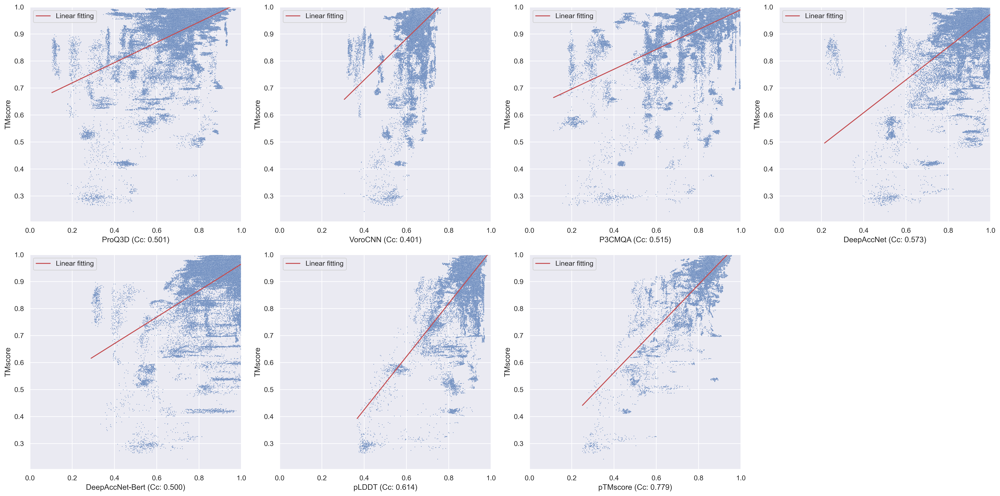

In [30]:
# TMscore
nrows = 2
ncols = 4
figsize = (22, 11)
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, sharex=False, sharey=False, figsize=figsize)
label = 'TMscore'
ms = ['ProQ3D', 'VoroCNN', 'P3CMQA', 'DeepAccNet', 'DeepAccNet-Bert', 'pLDDT', 'pTMscore']
data = df
for i, method in enumerate(ms):
    ax = axes[i // ncols, i % ncols]
    sns.scatterplot(data=data, x=method, y=label, s=1, ax=axes[i // ncols, i % ncols])
    d = data[~data[method].isna()]
    x = d[method]
    y = d[label]
    corr = d.corr()[method][label]
    ax.set_xlabel(f'{method} (Cc: {corr:.3f})')
    ax.set_xlim(0, 1)
    ax.set_ylim(None, 1)
    x_latent = np.linspace(x.min(), x.max(), 100)
    a, b = np.polyfit(x, y, 1)
    y_latent = a * x_latent + b
    ax.plot(x_latent, y_latent, 'r-')
    ax.legend(['Linear fitting'])
for i in range(len(ms), ncols * nrows):
    ax = axes[i // ncols, i % ncols]
    ax.axis('off')
plt.tight_layout()
plt.savefig(fig_dir / f'scatterplot_methods_{label}.png')
plt.show()

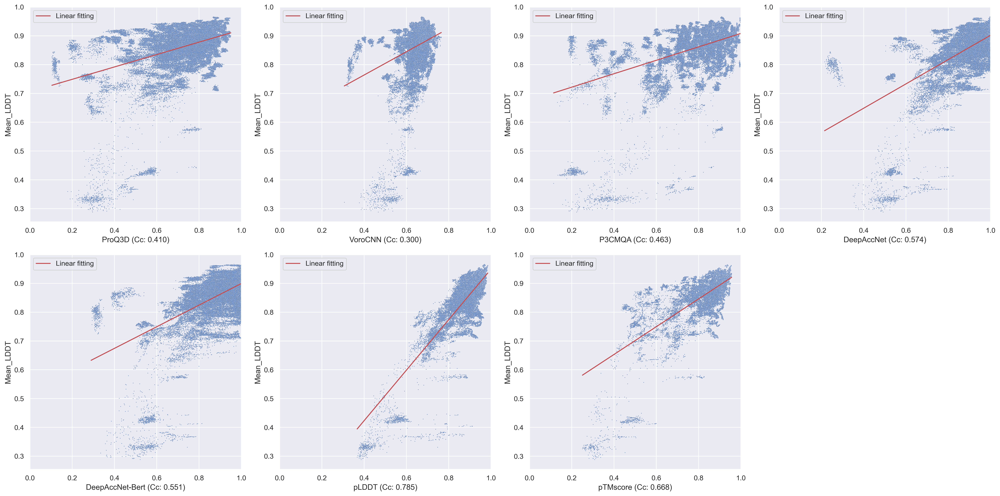

In [31]:
# Mean LDDT
nrows = 2
ncols = 4
figsize = (22, 11)
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, sharex=False, sharey=False, figsize=figsize)
label = 'Mean_LDDT'
ms = ['ProQ3D', 'VoroCNN', 'P3CMQA', 'DeepAccNet', 'DeepAccNet-Bert', 'pLDDT', 'pTMscore']
data = df[~df[label].isna()]
for i, method in enumerate(ms):
    ax = axes[i // ncols, i % ncols]
    sns.scatterplot(data=data, x=method, y=label, s=1, ax=axes[i // ncols, i % ncols])
    d = data[~data[method].isna()]
    x = d[method]
    y = d[label]
    corr = d.corr()[method][label]
    ax.set_xlabel(f'{method} (Cc: {corr:.3f})')
    ax.set_xlim(0, 1)
    ax.set_ylim(None, 1)
    x_latent = np.linspace(x.min(), x.max(), 100)
    a, b = np.polyfit(x, y, 1)
    y_latent = a * x_latent + b
    ax.plot(x_latent, y_latent, 'r-')
    ax.legend(['Linear fitting'])
for i in range(len(ms), ncols * nrows):
    ax = axes[i // ncols, i % ncols]
    ax.axis('off')
plt.tight_layout()
plt.savefig(fig_dir / f'scatterplot_methods_{label}.png')
plt.show()